# Proyecto: El Desafío de Don Rene

**MDS7202: Laboratorio de Programación Científica para Ciencia de Datos**

### Cuerpo Docente:

- Profesores: Matías Rojas - Mauricio Araneda
- Auxiliar: Ignacio Meza D.
- Ayudante: Rodrigo Guerra

*Por favor, lean detalladamente las instrucciones de la tarea antes de empezar a escribir.*


----

## Reglas

- Fecha de entrega: 13/12/2022 (Sin atrasos)
- **Grupos de 2 personas.**
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Estrictamente prohibida la copia. 
- Pueden usar cualquier material del curso que estimen conveniente.


---

## El desafio de Don Rene


Don Rene, afamado *influencer* y próximo emprendedor de IA, decide que será una buena idea darle un giro a su vida y dedicarse al rubro del asesoramiento de inversionistas en la industria de los videojuegos. 

El futuro empresario plantea que el éxito relativo de una inversión en una desarrolladora de juegos debe ser analizado desde un punto de vista basado en evidencia y no en la intuición. 
Por dicha razón, plantea que para el sería ideal que existiera una máquina que, dada las características de un nuevo videojuego (su género, el estudio que lo desarrolla, su historia, etc...), indique si este será potencialmente una inversión rentable o no.

Rene está convencido que el éxito de una inversión en videojuegos estar relacionada por dos características muy relevantes de estos una vez que salen al mercado:

**1. La potencial evaluación (Positivo, Negativo, etc...) que le den los usuarios que jugarán el juego.**

**2. Las potenciales ventas del juego.**

Si bien la idea puede sonar excelente, Don Rene carece en su totalidad de una formación en Ciencia de los Datos, por lo que decide ir en ayuda de expertos para implementar su idea.

Sin embargo, como fiel discipulo del libre mercado, decide no contratar a un equipo en particular, si no que tener la libertad de elegir entre muchos equipos que compiten entre si para saber cuál contratar. Para esto recurre a una triquiñuela recurrentemente utilizada en data science: Establecer una competencia abierta y contratar a los que cumplan mejor sus requisitos.


Para esto, Don Rene abre una competencia en la plataforma Codalab (plataforma similar a Kaggle) la cuál, espera que se replete de buenas propuestas. Los equipos que mejor evaluaciones obtengan (los primeros 5 de cada tabla) serán contratados y retribuidos con un cupón canjeable con la friolera cantidad de 1 punto bonus para el proyecto en el curso MDS7202.





### Definición Formal del Problema

El objetivo de este proyecto es relativamente sencillo, pero en extremo ambicioso: Tendrán que aplicar todo lo aprendido hasta este momento con el fin de solucionar 2 problemas distintos: 

1. **Clasificación de potenciales evaluaciones con las que los jugadores evaluarán los juegos**. Las posibles clases que deben asignar a cada juego son `('Negative', 'Mixed', 'Mostly Positive', 'Positive', 'Very Positive')`. La métrica de evaluación utilizada para medir la clasificación es `f1_weighted`.
2. **Regresión de las potenciales ventas que tendrán los juegos**. La métrica de evaluación utilizada para medir la clasificación es `r_2`.

Para esto, ustedes contarán un dataset que cuenta con diversa información de los juegos de la plataforma Steam (tales como fecha de lanzamiento, logros disponibles, plataforma, desarrollador, distribuidor, tags, etc...) más las etiquetas y valores a predecir.


El objetivo final es que participen en la competencia generada en Codalab. Una competencia de Data Science funciona generalmente de la siguiente manera: 

1. Se plantea un problema que los equipos deben resolver.
2. Se provee de datos de entrenamiento a los equipos para que generen modelos que resuelvan el problema.
3. Se provee de datos de prueba que los equipos deberán predecir con los modelos creados. Una vez predichos, los equipos deben subir los archivos a la plataforma, la cuál los evaluará y publicará en un tablero disponible para todos los participantes.

Por este motivo, se les provee de dos datasets: `train.pickle` y `test.pickle`.

- Por una parte, `train.pickle` está preparado que lo utilizen como conjunto de entrenamiento del modelo; por lo que incluye las etiquetas y valores por predecir. 

- Por otra parte, la evaluación de la competencia será hecha usando `test.pickle`. Es decir, este dataset solo contiene características de los juegos y ustedes deberán predecir tanto las potenciales evaluaciones como las posibles ventas de estos y subir sus resultados.

- Además, tendrán sample subissions, es decir, un ejemplo de como subir las evaluaciones.

Obviamente para subir archivos a la competencia deberán registrarse en Codalab. **Puden participar máximo 5 veces en la competencia** (la idea es evitar que se sobreajusten a los datos que deben predecir)

**IMPORTANTE**: Para la clasificación no usen la cantidad de ventas (target de la regresión) como atributo. Por otro lado, para la regresión no utilicen las evaluaciones como atributo para predecir. Infringir estas reglas implicará en no contar el puntaje de la competencia como tampoco poder participar de los bonus por los tops.




# Proyecto

### Equipo:

- Johnny Godoy: johnny-godoy
### Link de repositorio de GitHub: `\<https://johnny-godoy.github.io/laboratorios-mds/competencia/proyecto.ipynb>`


## 1. Introducción

El objetivo de este proyecto consiste en utilizar datos de videojuegos para predecir la cantidad de ventas estimadas y la puntuación que le dan los usuarios.
Para esto, se resuelven 2 tareas de aprendizaje de máquinas, en particular, con un modelo de regresión y otro de clasificación respectivamente.

Los datos que proveen es un dataset con 7881 ejemplos que describen una observación de un videojuego.
Son 13 atributos, mezclando tipo textual con numérico, y la variables objetivos son de tipo float (cuantitativo positivo) y str (cualitativo ordinal)

La primera tarea se evalua en base a la métrica $R^2$ ya que esta permite medir que tan bueno es el modelo con puntos de referencia un modelo perfecto y un modelo Dummy. La primera tarea se evalua en base a la métrica `f1_weighted` ya que esta penaliza tanto falsos positivos como falsos negativos de manera equitativa, y además evita que solamente se logre buena predicción para la clase mayoritaria, sino que se pesa según la cantidad de ejemplos.

Nuestra propuesta para resolver el problema consistieron en modelo basado en Gradient Boosted Trees de características generadas por Bag Of Words. En el caso de regresión, estas características que procesan con Truncated Singular Value Decomposition para reducir el efecto de características altamente correlacionadas.

Nuestro modelo superó las expectativas, llegando a un $R^2= 0.61$ en la competencia de regresión (que quedó sobreescrito por un puntaje menor, pero fue #1 al publicarse) y $f_1=0.37$ en la competencia de clasificación (#2 actualmente), a pesar de utilizar modelos relativamente simples y no complicar la ingeniería de características.
Existen varias posibilidades para mejorar este proyecto en todas partes, pero formulaciones simples de la primera iteración ya lograron un alto desempeño.

Imports y configuraciones

In [67]:
from __future__ import annotations

from zipfile import ZipFile
import dataclasses
import os

from pandas_profiling import ProfileReport
from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.experimental import enable_halving_search_cv
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, f1_score, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, HalvingGridSearchCV
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
import catboost as cb
import lightgbm as lgb
import numpy as np
import pandas as pd
import plotly.express as px
import scipy.stats

pd.options.plotting.backend = "plotly"

---
## 2. Análisis Exploratorio de Datos

### 2.1 Univariado

Primero analicemos cada característica por separado.

Cargando los datos

In [5]:
df_train = pd.read_pickle("data/raw/train.pickle")
df_test = pd.read_pickle("data/raw/test.pickle")
targets = ["estimated_sells", "rating"]

Creando una versión del dataframe uniendo train y test.

In [6]:
X = df_train.drop(targets, axis=1)
y = df_train[targets]
df_full = pd.concat([df_test.assign(split="test"),
                     X.assign(split="train")])
df_full

,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,tags,achievements,average_playtime,price,short_description,split
0,Frog Climbers,2016-10-06,1,TeamCrew,Dear Villagers,windows,0,Single-player;Local Multi-Player;Shared/Split ...,Indie,Indie;Local Multiplayer;Funny,0,239,4.99,Climb mountains. Beat your friends. Be a douch...,test
1,Aztaka,2009-11-05,1,Citeremis Inc.,Citeremis Inc.,windows;mac,0,Single-player,Action;RPG;Indie,RPG;Action;Indie,0,0,3.99,"Inspired by Aztec legend, this action/rpg side...",test
2,Assault Spy / アサルトスパイ,2018-10-02,1,Wazen,"NIS America, Inc.",windows,0,Single-player;Full controller support,Action;Indie,Action;Indie;Character Action Game,28,0,24.99,"Dash, evade, and smash your way to the truth a...",test
3,Down To One,2016-01-07,1,Gadget Games,Gadget Games,windows,0,Multi-player;Steam Trading Cards;Stats,Action,Action;Survival;Open World,0,206,0.79,42 Players Start. Only 1 will survive.Down to ...,test
4,Stranded Deep,2015-01-23,1,Beam Team Games,Beam Team Pty Ltd,windows;mac;linux,0,Single-player;Full controller support;Includes...,Adventure;Indie;Early Access,Early Access;Survival;Open World,8,272,10.99,Take the role of a plane crash survivor strand...,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7876,KOEWOTAYORINI / 声之寄托,2018-03-26,0,あみそ組,Pujia8 Studio;Gamera Game,windows,0,Single-player;Steam Achievements;Steam Cloud,Adventure;Free to Play;Indie;RPG,Free to Play;Adventure;Anime,20,65,0.00,“喂喂，求求你啦！救救我！” ——你接到这样一个电话 发出这样的求救，给你打电话的人，是一名...,train
7877,Montaro,2016-07-25,1,JCKSLAP,MBDL,windows,0,Single-player;Steam Achievements;Steam Trading...,Casual;Indie,Memes;Cute;Casual,15,174,0.79,Montaro is a DOGE.,train
7878,Moe Jigsaw,2018-03-23,1,ARES Inc.,ARES Inc.,windows,0,Single-player;Steam Achievements;Steam Trading...,Casual;Indie,Casual;Nudity;Indie,72,0,2.89,&quot;Moe Jigsaw&quot; is the definitive versi...,train
7879,Drunkn Bar Fight,2016-11-28,1,The Munky,The Munky,windows,0,Single-player;Multi-player;Online Multi-Player...,Action;Indie;Early Access,Early Access;Action;Indie,0,0,10.99,"VR PARTY GAMEDrunkn Bar Fight is a simple, imm...",train


Se genera un reporte de forma automática con `pandas-profiling`, el cual está guardado en `reports/report.html`

In [ ]:
profile = ProfileReport(df_full,
                        title="Reporte: El desafío de Don René",
                        explorative=True,
                        vars={"num": {"low_categorical_threshold": 0}
                             },
                       )

# profile.to_file("reports/report.html")
profile

Al efectuar una primera ronda de análisis exploratorio de datos pudimos notar lo siguiente:


* Tenemos 7881 datos de entrenamiento y 876 datos de prueba, es decir, aproximadamente 10% de los datos totales se usan para prueba. Esto nos inspira a utilizar 10-fold cross validation para simular la misma proporción de puntaje que se evaluará en la competencia.
* Ningún atributo tenía datos nulos. 
* Los datos están identificados por el nombre `name`, que es un campo de texto, y estos no están duplicados. No se espera que hayan características útiles acá, pues aún si hay franquicias famosas, estas tendrían muy pocas instancias para aprender algo de ellas.
* `release_date`es la fecha de lanzamiento, que se procesará para separarlo en días, meses y años. Podrían potencialmente agregarse [fechas de descuentos](https://steamcommunity.com/sharedfiles/filedetails/?id=759205611)
* `english` es una variable binaria que determina si el juego es o no en inglés. Está desbalanceada, con solamente 1.4% de valores falsos.
* `developer` y  `publisher` son una variables categóricas de alta cardinalidad. Puede tener sentido crear variables para algunos de los más famosos. 
* `categories`, `genres`, `tags` y `platforms` son variables categóricas. Están escritas como texto, y si un dato está en varias categorías entonces el texto contiene a todas separadas por `;`, por lo cual una codificación razonable será una binaria. Será importante ver la cantidad de palabras en cada caso.
* `required_age` es numérica, pero tiene solamente 6 valores únicos, tal vez una codificación ordinal distinta ayude.
* `achievements` es una variable muy concentrada en 0.
* `average_playtime` es una variable aún más fuermente concentrada en 0 y con alto skew, pero de manera más preocupante, esto no se esperaría, por lo que se asume que 0 es un valor imputado en el caso que Steam no reporte el tiempo de juego
* `price` está inflada con ceros, pero parece que una transformación logarímica pueda normalizarlo.
* `short_description` es texto libre, pero existen algunos valores repetidos de todos modos. Cabe investigar las 5 descripciones duplicadas. Lidiando con esto, se puede utilizar una codificación bag-of-words para obtener información de acá.
* Las únicas variables que parecen tener correlación no nulas son `(price, achievements)` para Pearson y `(price, required_age)` para Kendall

Viendo la distribución de las etiquetas.

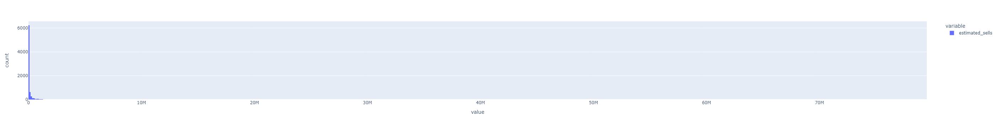

In [8]:
df_train["estimated_sells"].hist()

Está mal comportada, veamos una transformación boxcox:

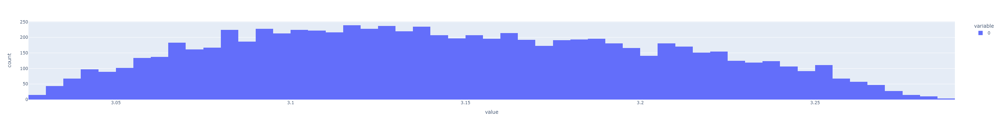

In [9]:
y_tr = pd.Series(scipy.stats.boxcox(df_train["estimated_sells"])[0])
y_tr.hist()

Esta variable está mejor comportada, y los gráficos que siguen se realizan en esta escala.

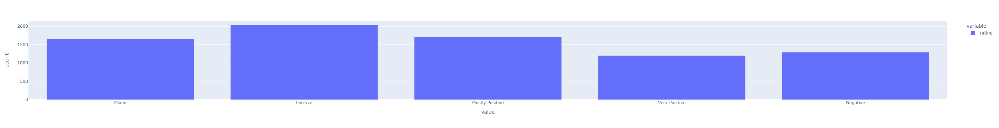

In [10]:
df_train["rating"].hist()

### 2.1 Bivariado

Ya se investigó la matriz de correlación, pero es interesante ahora ver las relaciones con la variable de respuesta.

Ahora determinando la información mutua de las variables numéricas con las objetivo. Esto captura relaciones no lineales.

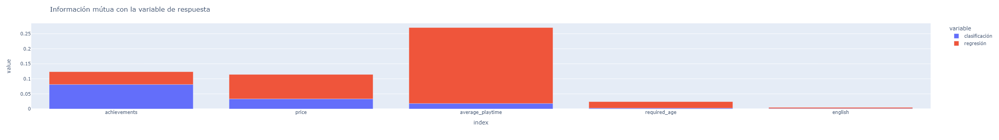

In [21]:
numericas = ["required_age", "english", "achievements", "average_playtime", "price"]
discretas = [True, True, True, False, False]
informacion = pd.DataFrame([mutual_info_classif(df_train[numericas],
                                                df_train["rating"],
                                                discrete_features=discretas,
                                               ),
                            mutual_info_regression(df_train[numericas],
                                                   # df_train["estimated_sells"],
                                                   y_tr,
                                                   discrete_features=discretas,
                                                  ),
                           ],
                           columns=numericas,
                           index=["clasificación", "regresión"],
                          ).T.sort_values(by="clasificación", ascending=False)
fig = px.bar(informacion)
fig.update_layout(title="Información mútua con la variable de respuesta")
fig.show()

La única información mutua alta es `average_playtime` con las ventas estimadas. Ahora, visualizando scatterplots:

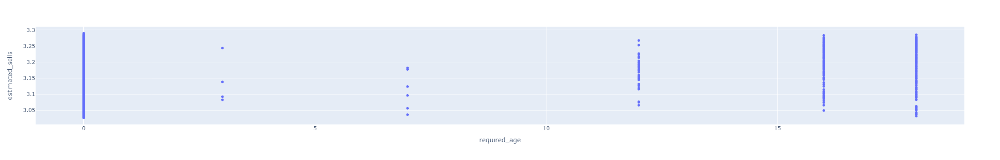

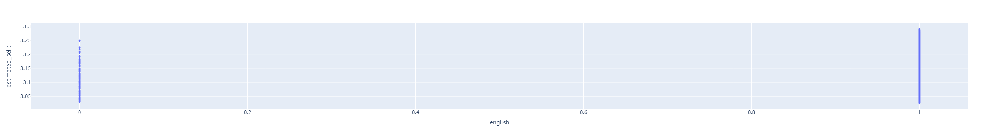

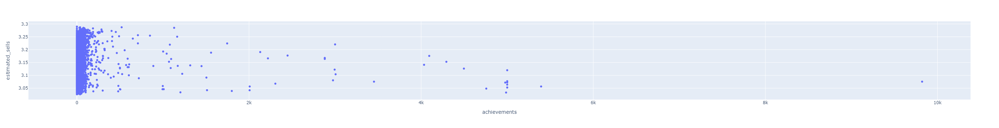

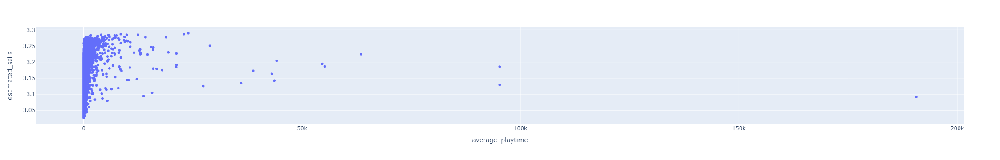

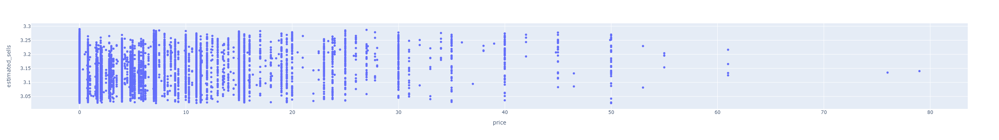

In [13]:
for feat in numericas:
    fig = px.scatter(x=df_train[feat], y=y_tr)
    fig.update_layout(xaxis_title=feat, yaxis_title="estimated_sells")
    fig.show()

Cabe ver la evolución de las ventas en el tiempo, tanto en cantidad como en media:

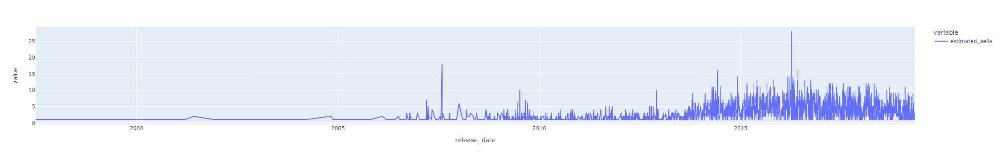

In [17]:
por_fecha = df_train[["release_date", "estimated_sells", "rating"]].groupby("release_date")
# Cantidad de ventas
por_fecha.estimated_sells.count().plot()

Vemos un aumento de popularidad en el tiempo, y peaks grandes.

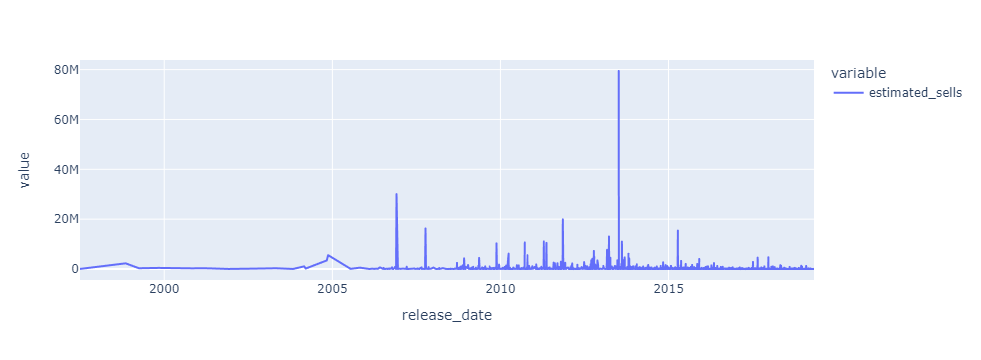

In [18]:
# Dinero promedio por fecha
por_fecha.estimated_sells.mean().plot()

### 2.2 Reducción de dimensionalidad

Nos interesa ver si podemos reducir las 3 variables continuas a un espacio de 2 dimensiones que se pueda visualizar, coloreándolos según la venta estimada. Para esto se prueban distintos algoritmos.

Por PCA

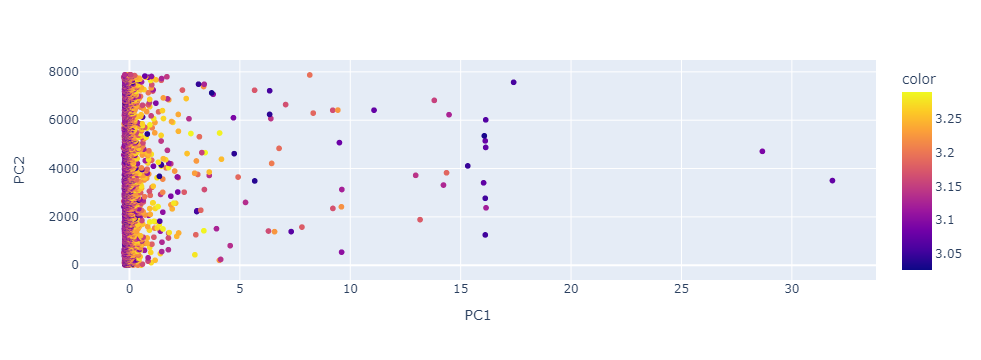

In [22]:
continuas = ["achievements", "average_playtime", "price"]
X_to_project = df_train[continuas]
processor = make_pipeline(StandardScaler(), PCA(n_components=2))
X_tr = processor.fit_transform(X_to_project)
fig = px.scatter(X_tr[:, 0], X_tr[:, 1], color=y_tr)
fig.update_layout(xaxis_title="PC1", yaxis_title="PC2")

Algunos puntos con bajas ventas se alejan del cluster principal, y hay bandas verticales, pero no se observa más. Entonces, se intenta una reducción no lineal con TSNE.

C:\Users\David\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\David\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



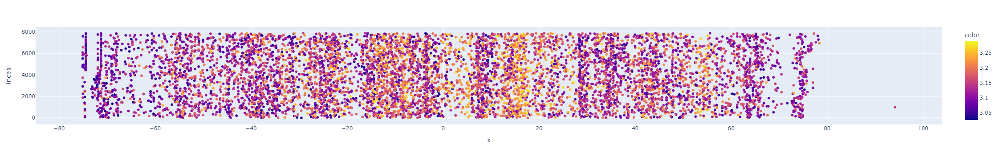

In [23]:
processor = make_pipeline(StandardScaler(), TSNE())
X_tr = processor.fit_transform(X_to_project)
px.scatter(X_tr[:, 0], X_tr[:, 1], color=y_tr)

Los métodos no supervisados no mostraron separaciones interesantes. Podemos intentar supervisados.

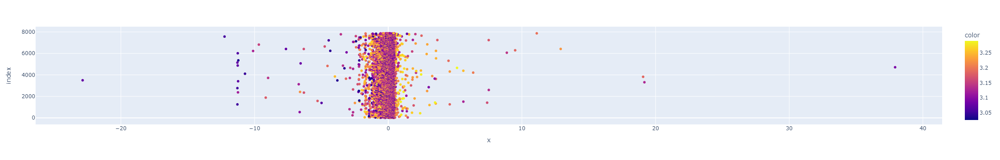

In [24]:
processor = PLSRegression()
X_tr = processor.fit_transform(X_to_project, y_tr)[0]
px.scatter(X_tr[:, 0], X_tr[:, 1], color=y_tr)

Esto no ayudó tampoco, por lo cual la reducción de dimensionalidad no fue existosa en encontrar un patrón que sea útil para implementar en los modelos.

---

## 3. Preparación de Datos

Cómo vimos antes, no hay datos nulos, así que no se incluirá ningún tipo de imputación.

Respecto a outlier, no se encontraron casos problemáticos, y además que estos no son problema para modelos basados en árboles de decisión, así que no se descartan.

#### 3.1 Fechas y numéricas

Para procesar las fechas, estas se separan en 3 características (dia-mes-año), y además se agrega una nueva característca que indica que se está a menos de 5 días de la Navidad, donde hay grandes descuentos de juegos.

In [27]:
def agregar_fechas(df: pd.DataFrame) -> pd.DataFrame:
    dt = pd.to_datetime(df.release_date).dt
    return df.assign(day=dt.day, month=dt.month, year=dt.year, is_xmas=((dt.day - 25).abs()) < 5 & (dt.month == 12))

In [28]:
df_train = agregar_fechas(df_train)
df_test = agregar_fechas(df_test)
X = df_train.drop(targets, axis=1)
y = df_train[targets]

Se probaron varios modelos, pero finalmente los ganadores fueron árboles, por lo cual no es tampoco necesario escalar las variables numéricas. Sin embargo, por compatibilidad con probar estos de nuevo, se utiliza `StandardScaler`.

In [57]:
numericas_fechas = numericas + ["day", "month", "year", "is_xmas"]
numeric_transformer = ("numeric", StandardScaler(), numericas_fechas)

#### 3.2 Características textuales

La plataforma se codifica utilizando un CountVectorizer, pero la característica no es propiamente textual (no sufre los problemas típicos del texto, así que no es buena forma de modelarlo), sino que categórica escrita de forma que es inconveniente.

In [29]:
bow = CountVectorizer(binary=True)
pd.DataFrame(bow.fit_transform(df_test.platforms).todense(),
             columns=bow.get_feature_names_out())

,linux,mac,windows
0,0,0,1
1,0,1,1
2,0,0,1
3,0,0,1
4,1,1,1
...,...,...,...
871,0,0,1
872,1,1,1
873,0,0,1
874,0,0,1


Por otro lado, `genres`, `categories` y `tags` sí son textos con muchas más posibles palabras, donde no todas estas dan información útil. Se utiliza igualmente `CountVectorizer`, con el cuidado de no separar por espacio sino que por `;` para no cortar palabras. 

In [7]:
bow = CountVectorizer(binary=True, tokenizer=lambda x: x.split(';'))
pd.DataFrame(bow.fit_transform(df_test.categories).todense(),
             columns=bow.get_feature_names_out())

,captions available,co-op,commentary available,cross-platform multiplayer,full controller support,in-app purchases,includes level editor,includes source sdk,local co-op,local multi-player,...,stats,steam achievements,steam cloud,steam leaderboards,steam trading cards,steam turn notifications,steam workshop,steamvr collectibles,valve anti-cheat enabled,vr support
0,0,0,0,0,1,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
871,0,0,0,0,0,1,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
872,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
873,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
874,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0


`short_description` igualmente es texto, pero en experimentos se determinó que esta característica no agregaba nada a la información que ya daban las otras características textuales, agregando solamente ruido al modelo.
Una siguiente iteración podría procesarla mejor, pero por ahora solamente la descartamos.

#### 3.3 Creando el ColumnTransformer

Se crean 2 distintos `ColumnTransformers` para estas tareas. Uno realiza solamente lo ya mencionado, y el otro agrega un paso de reducción de dimensionalidad, realizando `TruncatedSVD` para hacer _latent semantic analysis_ [como recomienda sklearn](https://scikit-learn.org/stable/modules/decomposition.html#lsa) para combatir sinonimia y polisemia en las características textuales (nuevamente, estamos ignorando `platforms`en esta parte)

In [58]:
mixable = ("tags", "genres", "categories")
mixable_categorizer = ColumnTransformer([(feat, clone(bow), feat) for feat in mixable])


def get_transformer(has_svd: bool) -> ColumnTransformer:
    if has_svd:
        text_pipeline = make_pipeline(mixable_categorizer, TruncatedSVD(n_components=100))
    else:
        text_pipeline = mixable_categorizer
    return ColumnTransformer([("cat", text_pipeline, mixable),
                              numeric_transformer,
                              ("platform", clone(bow), "platforms")]
                             )

In [59]:
with_svd = get_transformer(True)
with_svd

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('columntransformer',
                                                  ColumnTransformer(transformers=[('tags',
                                                                                   CountVectorizer(binary=True),
                                                                                   'tags'),
                                                                                  ('genres',
                                                                                   CountVectorizer(binary=True),
                                                                                   'genres'),
                                                                                  ('categories',
                                                                                   CountVectorizer(binary=True),
                                                                                   'categories')])),
                                                 ('truncatedsvd',
                                                  TruncatedSVD(n_components=100))]),
                                 ('tags', 'genres', 'categories')),
                                ('numeric', StandardScaler(),
                                 ['required_age', 'english', 'achievements',
                                  'average_playtime', 'price', 'day', 'month',
                                  'year', 'is_xmas']),
                                ('platform', CountVectorizer(binary=True),
                                 'platforms')])

In [60]:
without_svd = get_transformer(False)
without_svd

ColumnTransformer(transformers=[('cat',
                                 ColumnTransformer(transformers=[('tags',
                                                                  CountVectorizer(binary=True),
                                                                  'tags'),
                                                                 ('genres',
                                                                  CountVectorizer(binary=True),
                                                                  'genres'),
                                                                 ('categories',
                                                                  CountVectorizer(binary=True),
                                                                  'categories')]),
                                 ('tags', 'genres', 'categories')),
                                ('numeric', StandardScaler(),
                                 ['required_age', 'english', 'achievements',
                                  'average_playtime', 'price', 'day', 'month',
                                  'year', 'is_xmas']),
                                ('platform', CountVectorizer(binary=True),
                                 'platforms')])

---

## 4. Baseline

Primero se hace hold-out para evaluar el baseline. Se divide de forma estratificada según el rating.

**ERROR NOTADO A POSTERIORI:** Este split se utilizó tanto para regresión como para clasificación,
pero en regresión no se necesita esta estratificación. 
La regla decía no utilizar esto como característica del modelo, y se utilizó accidentalmente como parte de la validación, pero no del modelo.
Esta forma no aleatoria de evaluar puede explicar el error de validación del cual se hablará después.

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0, stratify=y.rating)

En esta sección se realizaron una variedad de pruebas para determinar qué modelos deberían ser optimizados con Grid Search. Estos incluyen:

* Lineal: SVC y SGD
* Variantes de Naïve Bayes para clasificación
* Árboles: CART, ExtraTrees, XGBoost, LGBM, CatBoost
* KNN

También se empezaron a validar distintas formas de procesamiento para saber cuales incluir. Entre estas están:
* Incluir solamente el texto
* Incluir solamente lo numérico
* Incluir `short_description` codificado con `CountVectorizer` y con `TfidfVectorizer`

Sin embargo, cómo simplificación solamente se reportará el desempeño de árboles de decisión como modelo simple, y el modelo elegido para optimizar en cada caso de regresión y clasificación (CatBoost y LGBM respectivamente). Se variará solamente entre usar o no SVD, pero se mantienen las características decididas en la preparación de datos.

### 4.1 Regressión

Acá vemos un muy bajo $R^2$ para el árbol de decisión, cercano a $0$, mejorando un poco por usar SVD, mientras que CatBoostRegressor le va mucho mejor con $R^2$ de 0.24, con poca diferencia pero mejorando al no usar SVD.

#### Bajo calibre

In [74]:
reg = make_pipeline(with_svd, DecisionTreeRegressor(random_state=0, max_depth=3))
reg.fit(X_train, y_train.estimated_sells)
r2_score(y_test.estimated_sells, reg.predict(X_test))

0.09236911367165701

In [75]:
reg = make_pipeline(without_svd, DecisionTreeRegressor(random_state=0, max_depth=3))
reg.fit(X_train, y_train.estimated_sells)
r2_score(y_test.estimated_sells, reg.predict(X_test))

0.06259848348501729

#### Alto calibre

In [76]:
reg = make_pipeline(with_svd, cb.CatBoostRegressor(random_state=0, verbose=False))
reg.fit(X_train, y_train.estimated_sells)
r2_score(y_test.estimated_sells, reg.predict(X_test))

0.2637755626634174

In [77]:
reg = make_pipeline(without_svd, cb.CatBoostRegressor(random_state=0, verbose=False))
reg.fit(X_train, y_train.estimated_sells)
r2_score(y_test.estimated_sells, reg.predict(X_test))

0.24614066030291437

### 4.2 Clasificación

En este caso, los modelos de bajo calibre muestran desempeño similar al aleatorio. Esto se mejora un poco por LightGBM sin utilizar SVD.

#### Bajo calibre

In [78]:
clf = make_pipeline(with_svd, DecisionTreeClassifier(random_state=0, max_depth=3))
clf.fit(X_train, y_train.rating)
f1_score(y_test.rating, clf.predict(X_test), average="weighted")

0.22961502770897055

In [79]:
clf = make_pipeline(without_svd, DecisionTreeClassifier(random_state=0, max_depth=3))
clf.fit(X_train, y_train.rating)
f1_score(y_test.rating, clf.predict(X_test), average="weighted")

0.2229107368404749

#### Alto calibre

In [80]:
clf = make_pipeline(with_svd, lgb.LGBMClassifier(random_state=0))
clf.fit(X_train, y_train.rating)
f1_score(y_test.rating, clf.predict(X_test), average="weighted")

0.3275020551556012

In [81]:
clf = make_pipeline(without_svd, lgb.LGBMClassifier(random_state=0))
clf.fit(X_train, y_train.rating)
f1_score(y_test.rating, clf.predict(X_test), average="weighted")

0.3310894337493198

---

## 5. Optimización del Modelo

Creamos funciones que ayudan a hacer el Grid Search más simple. Esta función solamente se corrió con los modelos ganadores (LGBM y CatBoost)

* Se usa HalfGridSearch para CatBoost que es el modelo más lento de correr. Por este mismo motivo, se utilizan parámetros que maximizan la velocidad de búsqueda (3 fold CV, aggresive elimination, paralelismo en 6 núcleos).
* Se usa GridSearch para LGBM que logra correr más velozmente, con 10 fold cv para mantener la proporción de testing real.

No se cambió la forma de preprocesamiento o introdujo selección de características (los árboles la tienen built-in), solamente si se realizaba o no SVD.

In [83]:
feature_params = {}
def half_grid_search_eval(model, model_params, is_reg=True, preprocessor=with_svd):
    """Calcula el mejor modelo con gridsearch, imprime su reporte de clasificación,
    retorna el modelo y sus parámetros."""
    y_train_to_use = y_train.estimated_sells if is_reg else y_train.rating
    y_test_to_use = y_test.estimated_sells if is_reg else y_test.rating
    pipeline = Pipeline(steps=[("pipeline", with_svd), ("model", model)])
    model_params = {f"model__{key}": val for key, val in model_params.items()}
    grid = HalvingGridSearchCV(pipeline, feature_params | model_params,
                               cv=3, scoring="r2" if is_reg else "f1_weighted", random_state=0,
                               n_jobs=-1, min_resources="smallest", aggressive_elimination=True,
                               verbose=10,
                              )
    best_model = grid.fit(X_train, y_train_to_use).best_estimator_
    if not is_reg:
        print(classification_report(y_test_to_use, best_model.predict(X_test)))
    else:
        print(r2_score(y_test_to_use, best_model.predict(X_test)))
    return best_model, grid.best_params_


def grid_search_eval(model, model_params, is_reg=True):
    """Calcula el mejor modelo con gridsearch, imprime su reporte de clasificación,
    retorna el modelo y sus parámetros."""
    y_train_to_use = y_train.estimated_sells if is_reg else y_train.rating
    y_test_to_use = y_test.estimated_sells if is_reg else y_test.rating
    pipeline = Pipeline(steps=[("pipeline", with_svd), ("model", model)])
    model_params = {f"model__{key}": val for key, val in model_params.items()}
    grid = GridSearchCV(pipeline, feature_params | model_params,
                        cv=10, scoring="r2" if is_reg else "f1_weighted",
                        n_jobs=-1, verbose=10,
                       )
    best_model = grid.fit(X_train, y_train_to_use).best_estimator_
    if not is_reg:
        print(classification_report(y_test_to_use, best_model.predict(X_test)))
    else:
        print(r2_score(y_test_to_use, best_model.predict(X_test)))
    return best_model, grid.best_params_

### 5.1 Regresión

Para encontrar el mejor modelo de regresión, se utilizó el siguiente código:

```python
cbreg_params = {'iterations': [500, 1000, 2000],
                'depth': np.arange(6, 11),}
model, params = half_grid_search_eval(cb.CatBoostRegressor(random_state=0, verbose=False), cbreg_params)

```

Mostrando un $R^2=0.35$ con SVD y $R^2=0.37$ sin SVD, pero con SVD se logró un puntaje de 0.61 en la competencia. 

Este demora 1 hora en correr, por lo cual no se incluye como celda de código. Los hiperparámetros se eligieron según la [guía de usuario de CatBoost](https://catboost.ai/en/docs/concepts/parameter-tuning), cambiando el número de árboles al doble y la mitad del valor por defecto (1000), y la profundidad en el rango recomendado. Esto resultó en un mejor modelo con 2000 árboles y profundidad máxima 7.

### 5.2 Clasificación

In [89]:
best_reg = make_pipeline(with_svd, cb.CatBoostRegressor(random_state=0, verbose=False, depth=7, iterations=2_000))

Para encontrar el mejor modelo de clasificación, se utilizó el siguiente código:

```python
lgclf_params = {'extra_trees': [True, False],
                'max_bin': [127, 255, 511],
                'num_leaves': [31, 63, 127],
                'boosting_type': ["gbdt", "dart", "goss"],
               }

model, params = grid_search_eval(lgb.LGBMClassifier(random_state=0), lgclf_params, False, without_svd)

```

Mostrando un $f_1=0.33$ con SVD y $f_2=0.34$ sin SVD.

Este demora 15 minutos en correr, por lo cual no se incluye como celda de código. Los hiperparámetros se eligieron según la [guía de usuario de LGBM](https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html), la cual recomienda:

* Cambiar `max_bin` (se pone la mitad y el doble del valor por defecto)
* Lo mismo con `num_leaves`
* Intentar distintos tipos de boosting
* Intentar prender/apagar extra_trees

Con esto, los mejores parámetros logrados se pondrán en el clasificador como sigue

In [87]:
best_clf = make_pipeline(without_svd, lgb.LGBMClassifier(extra_trees=True,
                                                         random_state=0,
                                                         max_bins=511,
                                                         num_leaves=31,
                                                         boosting_type='dart',
                                                        )
                        )

Ambos de estos modelos mejoran el baseline. En el caso de la regresión, es una mejora más significativa que para la clasificación, donde se realizaron experimentos aún más exhaustivos, pero no se logró superar estos puntajes nunca.

---

## 6. Conclusiones

En este trabajo, se logró resolver existósamente el problema, logrando un 0.61 de $R^2$ y 0.34 de $f_1$ pesado,
logrando #1 y #2 en los tableros de la competencia al momento.

El rendimiento del baseline simple fue muy cercano al que se esperaría de modelos Dummy, por lo que un árbol poco profundo no logra aprender los patrones útiles en los datos. Modelos de Gradient Boosted Trees lograron un mucho mejor desempeño, y por tanto fueron seleccionados para una búsqueda de grilla. Esta fue parcialmente exitosa, mejorando significativamente el puntaje de la regresión $(0.24 \to 0.37)$, pero nunca se logró mejorar el puntaje de clasificación significativamente $(0.33 \to 0.34)$.

Finalmente, estoy conforme con los resultados para la regresión, pero la clasificación requiere más trabajo. Por ejemplo, se debería extender el análisis de los datos (no se estudiaron ninguna de las características de texto, y no se estudia el problema de clasificación a suficiente profundidad) y probar distintas alternativas en procesamiento y modelamiento (modelos de NLP, uso de ensamblaje de distintos modelos candidato).Por ejemplo, vale considerar que clases tienen un orden existente, lo cual métodos actuales están ignorando totalmente en vez de modelarlo. Considero que la primera prioridad para una siguiente iteración de este trabajo sería mejorar la metodología de validación, pues los puntajes obtenidos en este notebook no reflejan los puntajes en el tablero de la competencia ni siquiera de manera aproximada, dejando esta como la parte más débil de este proyecto en mi opinión.

El uso de una competencia fue interesante y didáctico, en particular poder aprender de las otras técnicas, modelos y observaciones que realizaron otros equipos para abordar el mismo problema. Acá los tableros permitieron ver cómo comparaban todas estas, y causaba motivación a continuar iterando el proyecto implementando las grandes ideas de otros grupos, ensamblando el conocimiento colectivo.

Sin embargo, utilizar una plataforma desconocida causa problemas técnicos, y un tutorial previo hubiera sido bueno para evitarlos.

---

<br>

### Anexo: Generación de Archivo Submit de la Competencia

Para subir los resultados obtenidos a la pagina de CodaLab utilice la función `generateFiles` entregada mas abajo. Esto es debido a que usted deberá generar archivos que respeten extrictamente el formato de CodaLab, de lo contario los resultados no se veran reflejados en la pagina de la competencia.

Para los resultados obtenidos en su modelo de clasificación y regresión, estos serán guardados en un archivo zip que contenga los archivos `predicctions_clf.txt` para la clasificación y `predicctions_rgr.clf` para la regresión. Los resultados, como se comento antes, deberan ser obtenidos en base al dataset `test.pickle` y en cada una de las lineas deberan presentar las predicciones realizadas.

Ejemplos de archivos:

- [ ] `predicctions_clf.txt`

        Mostly Positive
        Mostly Positive
        Negative
        Positive
        Negative
        Positive
        ...

- [ ] `predicctions_rgr.txt`

        16103.58
        16103.58
        16041.89
        9328.62
        107976.03
        194374.08
        ...



Primero se entrenan los modelos optimizados, ahora usando todos los datos.

In [91]:
best_clf.fit(X, y.rating)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('cat',
                                                  ColumnTransformer(transformers=[('tags',
                                                                                   CountVectorizer(binary=True),
                                                                                   'tags'),
                                                                                  ('genres',
                                                                                   CountVectorizer(binary=True),
                                                                                   'genres'),
                                                                                  ('categories',
                                                                                   CountVectorizer(binary=True),
                                                                                   'categories')]),
                                                  ('tags', 'genres',
                                                   'categories')),
                                                 ('numeric', StandardScaler(),
                                                  ['required_age', 'english',
                                                   'achievements',
                                                   'average_playtime', 'price',
                                                   'day', 'month', 'year',
                                                   'is_xmas']),
                                                 ('platform',
                                                  CountVectorizer(binary=True),
                                                  'platforms')])),
                ('lgbmclassifier',
                 LGBMClassifier(boosting_type='dart', extra_trees=True,
                                max_bins=511, random_state=0))])

In [92]:
best_reg.fit(X, y.estimated_sells)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('columntransformer',
                                                                   ColumnTransformer(transformers=[('tags',
                                                                                                    CountVectorizer(binary=True),
                                                                                                    'tags'),
                                                                                                   ('genres',
                                                                                                    CountVectorizer(binary=True),
                                                                                                    'genres'),
                                                                                                   ('categories',
                                                                                                    CountVectorizer(binary=True),
                                                                                                    'categories')])),
                                                                  ('truncatedsvd',
                                                                   TruncatedSVD(n_components=100))]),
                                                  ('tags', 'genres',
                                                   'categories')),
                                                 ('numeric', StandardScaler(),
                                                  ['required_age', 'english',
                                                   'achievements',
                                                   'average_playtime', 'price',
                                                   'day', 'month', 'year',
                                                   'is_xmas']),
                                                 ('platform',
                                                  CountVectorizer(binary=True),
                                                  'platforms')])),
                ('catboostregressor',
                 <catboost.core.CatBoostRegressor object at 0x00000224ABEA42B0>)])

In [121]:
def generateFiles(predict_data, clf_pipe, rgr_pipe):
    """Genera los archivos a subir en CodaLab

    Input
    predict_data: Dataframe con los datos de entrada a predecir
    clf_pipe: pipeline del clf
    rgr_pipe: pipeline del rgr

    Ouput
    archivo de txt
    """
    y_pred_clf = clf_pipe.predict(predict_data) #.as_data_frame().values[:, 0].flatten()
    y_pred_rgr = rgr_pipe.predict(predict_data) #.as_data_frame().values.flatten()

    with open('./predictions_clf.txt', 'w') as f:
        for item in y_pred_clf:
            f.write("%s\n" % item)

    with open('./predictions_rgr.txt', 'w') as f:
        for item in y_pred_rgr:
            f.write("%s\n" % item)

    with ZipFile('predictions_final.zip', 'w') as zipObj2:
       zipObj2.write('predictions_rgr.txt')
       zipObj2.write('predictions_clf.txt')

    os.remove("predictions_rgr.txt")
    os.remove("predictions_clf.txt")

Ahora basta correr esta línea para guardar las predicciones.

In [122]:
generateFiles(df_test, clf_fitted, reg_fitted)